In [1]:
import scipy.stats as stats
from sklearn.metrics import silhouette_score
from sklearn.compose import ColumnTransformer
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture  # Import GaussianMixture
from datetime import datetime
# Set display options to show all columns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
data = pd.read_csv(r"C:\Users\ashka\OneDrive\Documents\DA 205 Segmentation\final version.csv")
data.head()

,user_id,age,gender,married,has_children,total_sessions,total_page_clicks,avg_page_clicks_per_session,discount_flight_proportion,mean_session_time,total_flights_booked,total_hotels_booked,total_cancellations,avg_flight_discount,avg_hotel_discount,total_checked_bags,percentage_flights_with_checked_bags,avg_base_fare_usd,avg_hotel_per_room_usd,scaled_ads_per_km,days_since_last_session
0,23557,64,F,1,0,8,82,10.250,0.000,76.625000,0,2,0,0.000,0.250,NaN,0.0,NaN,177.0,NaN,-14
1,94883,51,F,1,0,8,73,9.125,0.000,67.750000,2,2,0,0.000,0.125,1.0,50.0,432.045,90.0,NaN,0
2,101486,50,F,1,1,8,131,16.375,0.250,122.250000,1,2,0,0.250,0.000,0.0,0.0,189.910,198.5,NaN,-10
3,101961,42,F,1,0,8,126,15.750,0.250,117.750000,5,5,0,0.250,0.125,2.0,40.0,248.532,136.0,0.000727,-6
4,106907,44,F,1,1,8,240,30.000,0.125,758.915066,2,2,1,0.125,0.125,10.0,500.0,13902.060,129.0,NaN,-1


In [3]:
# Fill NaN values in selected columns with appropriate values
data['total_checked_bags'].fillna(1.0, inplace=True)
data['percentage_flights_with_checked_bags'].fillna(50.0, inplace=True)
data['avg_base_fare_usd'].fillna(391.92, inplace=True)
data['avg_hotel_per_room_usd'].fillna(163.0, inplace=True)
data['scaled_ads_per_km'].fillna(0.008667, inplace=True)
data['days_since_last_session'].fillna(-1, inplace=True)

# Calculate the 'bargain_hunter_index'
data['bargain_hunter_index'] = (
    data['scaled_ads_per_km'] * 
    data['discount_flight_proportion'] * 
    data['avg_flight_discount']
)

# Display the updated information about missing values after filling
missing_values_after_filling = data.isnull().sum()
print("Missing Values After Filling:")
print(missing_values_after_filling)


Missing Values After Filling:
user_id                                 0
age                                     0
gender                                  0
married                                 0
has_children                            0
total_sessions                          0
total_page_clicks                       0
avg_page_clicks_per_session             0
discount_flight_proportion              0
mean_session_time                       0
total_flights_booked                    0
total_hotels_booked                     0
total_cancellations                     0
avg_flight_discount                     0
avg_hotel_discount                      0
total_checked_bags                      0
percentage_flights_with_checked_bags    0
avg_base_fare_usd                       0
avg_hotel_per_room_usd                  0
scaled_ads_per_km                       0
days_since_last_session                 0
bargain_hunter_index                    0
dtype: int64


C:\Users\ashka\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


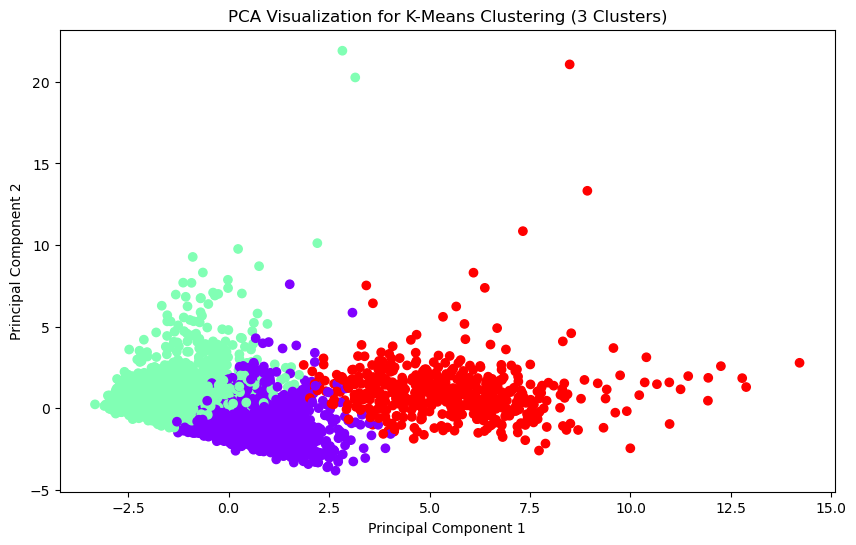

C:\Users\ashka\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


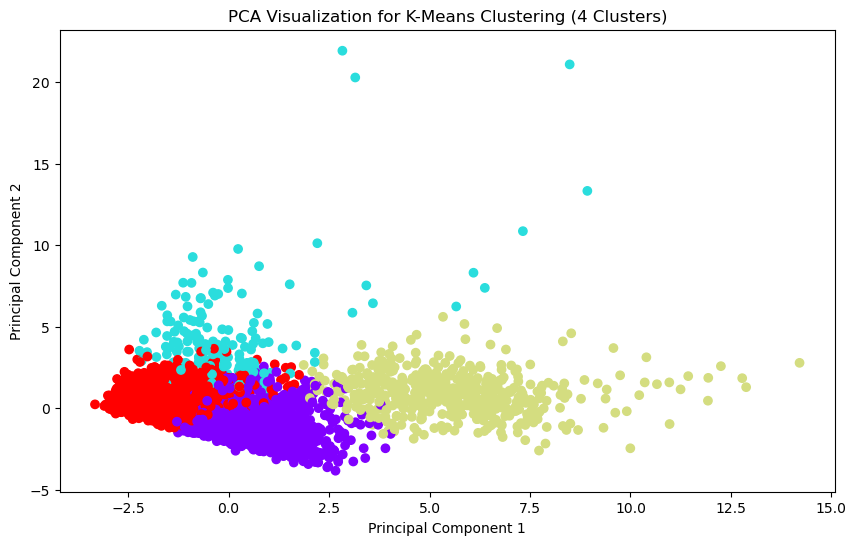

C:\Users\ashka\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


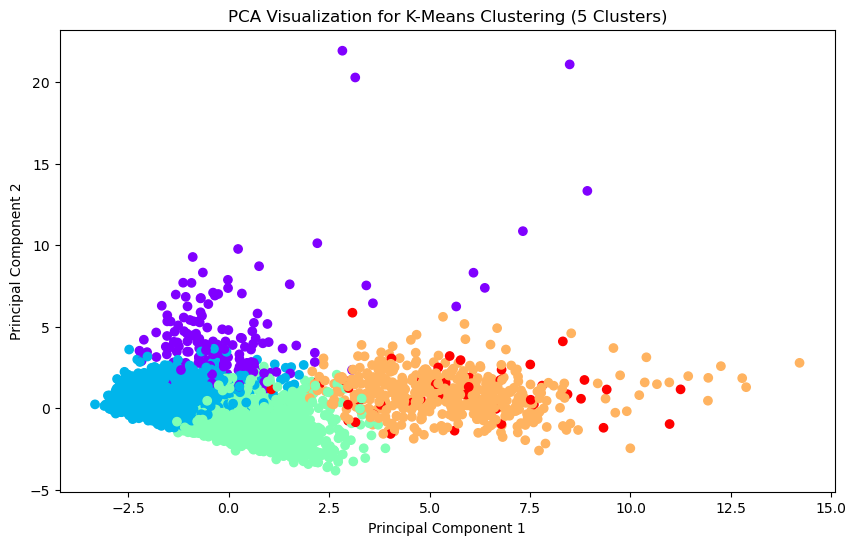

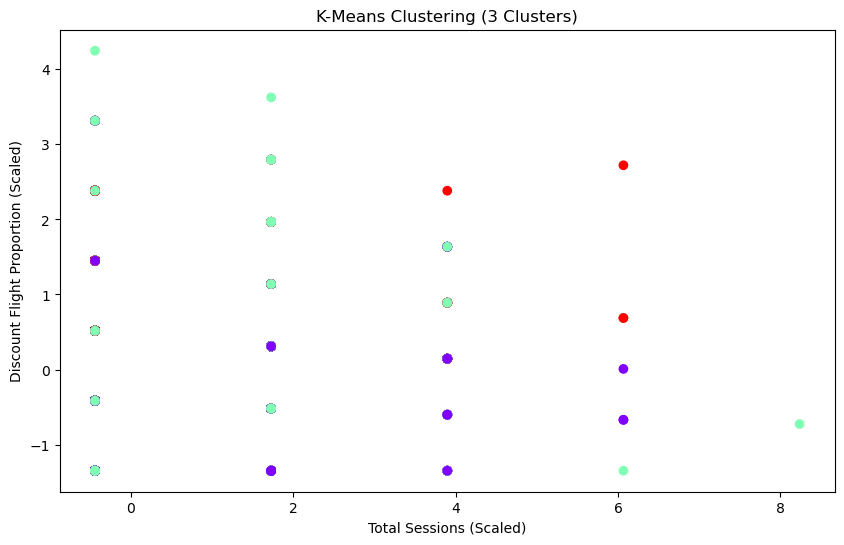

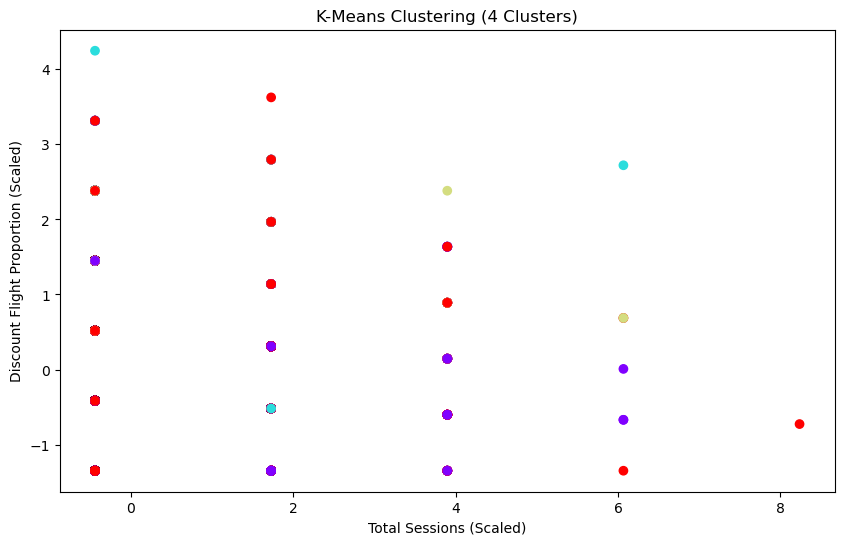

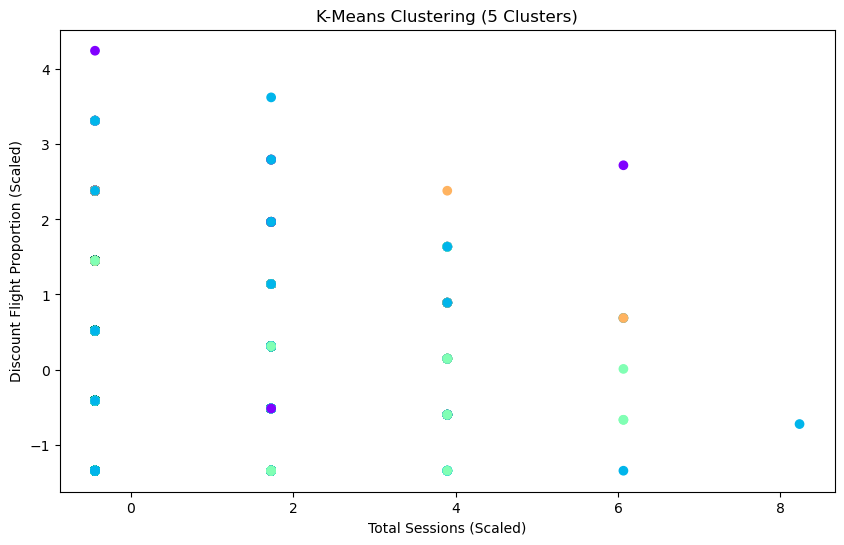

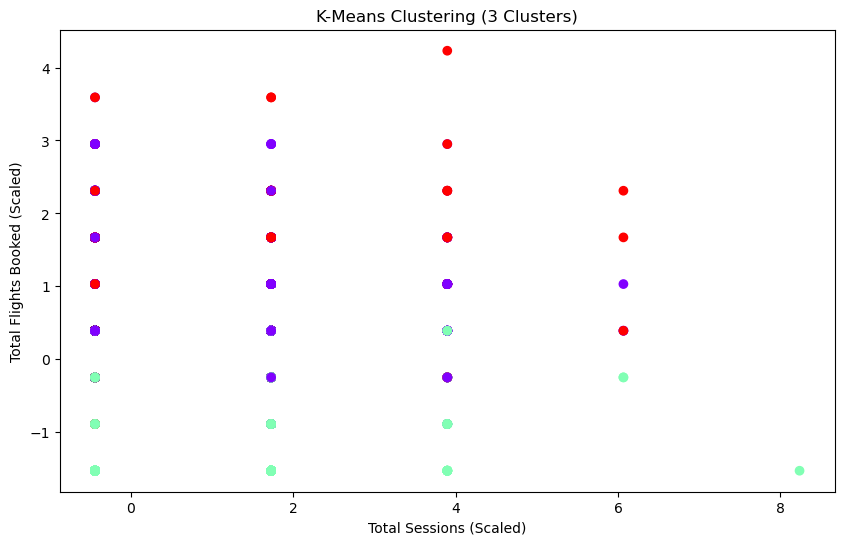

...

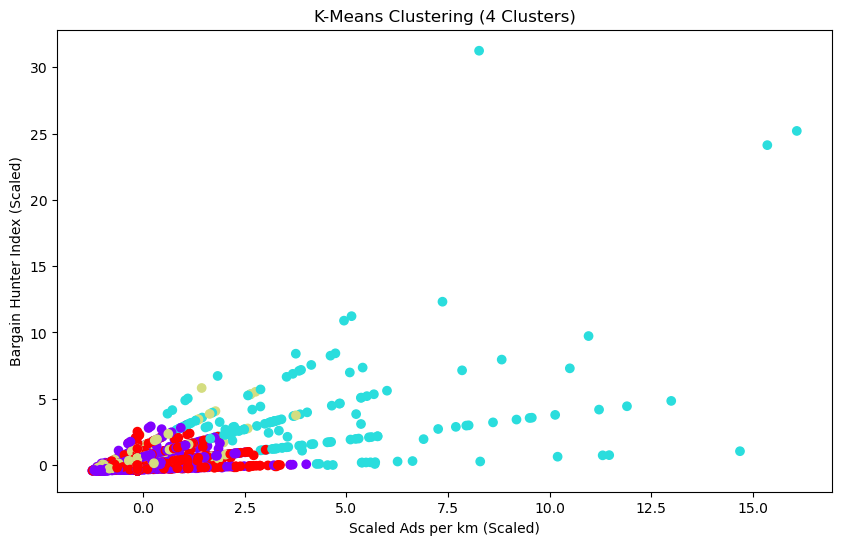

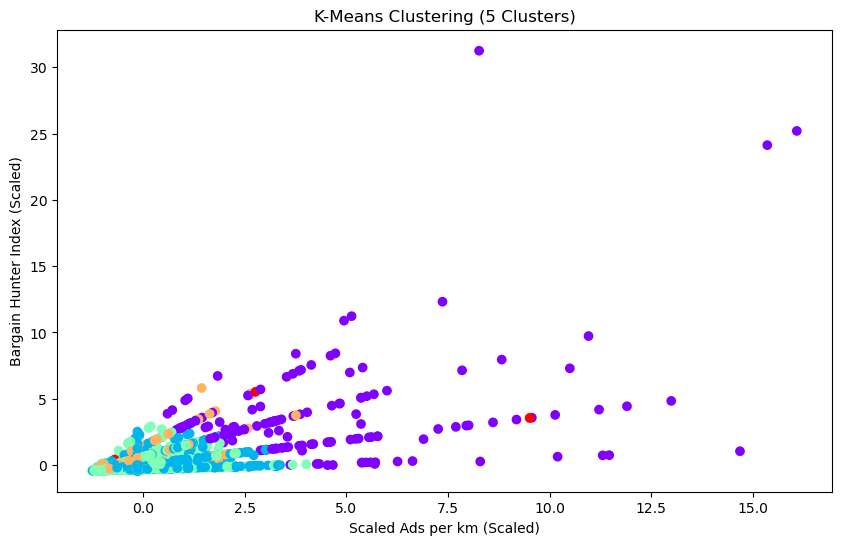

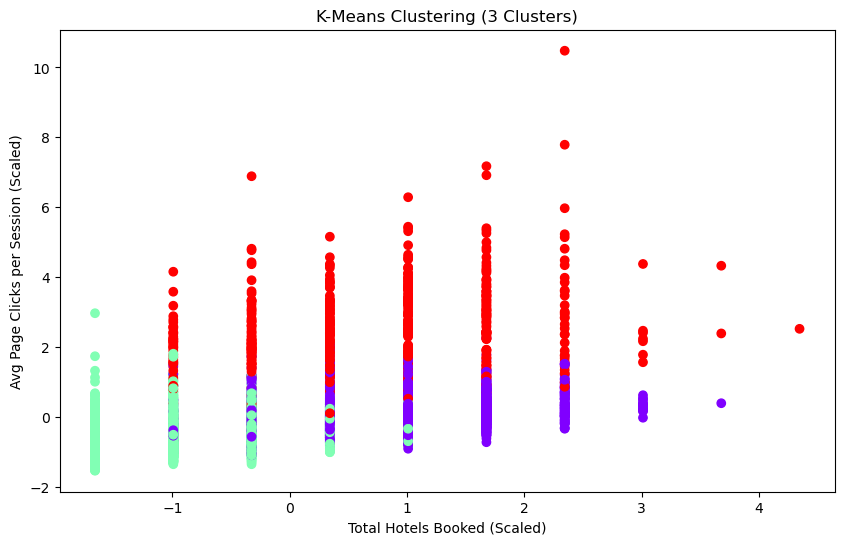

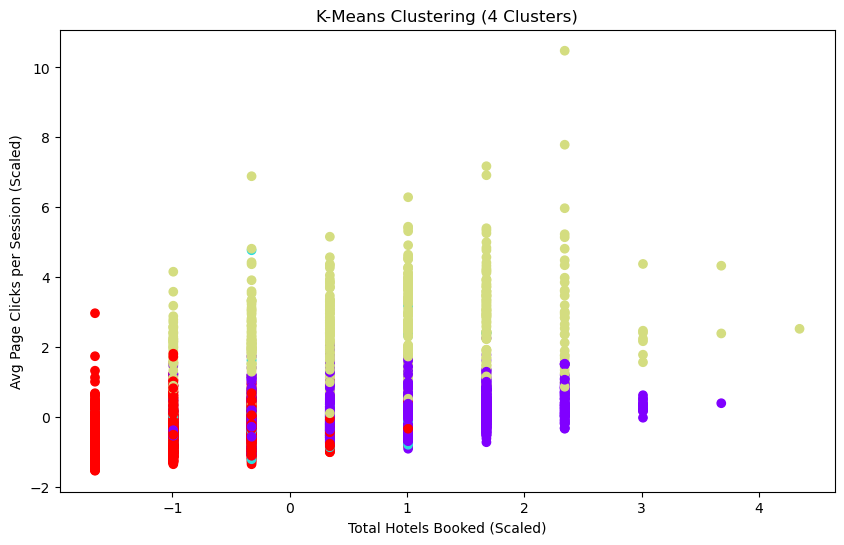

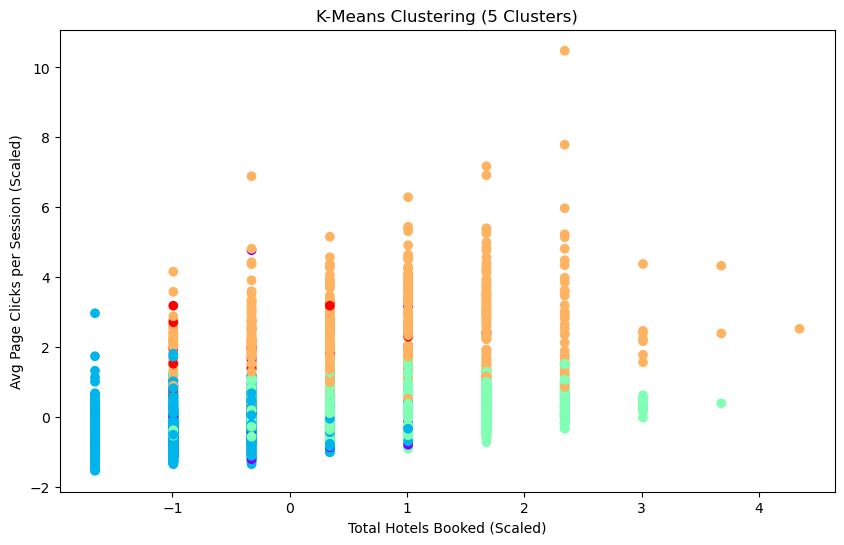

In [4]:
# Make a copy of the original data
data_copy = data.copy()

# Perform one-hot encoding for the 'gender' column
gender_encoded = pd.get_dummies(data_copy['gender'], prefix='gender', drop_first=True)

# Select the relevant columns for scaling
columns_to_scale = ['age', 'total_sessions', 'total_page_clicks', 'avg_page_clicks_per_session',
                    'discount_flight_proportion', 'mean_session_time', 'total_flights_booked',
                    'total_hotels_booked', 'total_cancellations',
                    'avg_hotel_discount', 'total_checked_bags', 'percentage_flights_with_checked_bags',
                    'avg_base_fare_usd', 'avg_hotel_per_room_usd', 'scaled_ads_per_km',
                    'days_since_last_session', 'bargain_hunter_index']


# Select relevant features for clustering
selected_features = columns_to_scale
scaler = StandardScaler()
X_scaled = scaler.fit_transform(data_copy[selected_features])

# Perform K-Means clustering for 3, 4, and 5 clusters
num_clusters = [3, 4, 5]
cluster_results = {}

for n_clusters in num_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    clusters = kmeans.fit_predict(X_scaled)
    cluster_results[n_clusters] = clusters

    # Perform PCA for visualization
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    # Visualize the PCA clusters
    plt.figure(figsize=(10, 6))
    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, cmap='rainbow')
    plt.title(f'PCA Visualization for K-Means Clustering ({n_clusters} Clusters)')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.show()

# Visualize the clusters
for n_clusters, clusters in cluster_results.items():
    plt.figure(figsize=(10, 6))
    plt.scatter(X_scaled[:, selected_features.index('total_sessions')], X_scaled[:, selected_features.index('discount_flight_proportion')], c=clusters, cmap='rainbow')
    plt.title(f'K-Means Clustering ({n_clusters} Clusters)')
    plt.xlabel('Total Sessions (Scaled)')
    plt.ylabel('Discount Flight Proportion (Scaled)')
    plt.show()

# Visualize the clusters
for n_clusters, clusters in cluster_results.items():
    plt.figure(figsize=(10, 6))
    plt.scatter(X_scaled[:, selected_features.index('total_sessions')], X_scaled[:, selected_features.index('total_flights_booked')], c=clusters, cmap='rainbow')
    plt.title(f'K-Means Clustering ({n_clusters} Clusters)')
    plt.xlabel('Total Sessions (Scaled)')
    plt.ylabel('Total Flights Booked (Scaled)')
    plt.show()

# Visualize the clusters
for n_clusters, clusters in cluster_results.items():
    plt.figure(figsize=(10, 6))
    plt.scatter(X_scaled[:, selected_features.index('total_sessions')], X_scaled[:, selected_features.index('bargain_hunter_index')], c=clusters, cmap='rainbow')
    plt.title(f'K-Means Clustering ({n_clusters} Clusters)')
    plt.xlabel('Total Sessions (Scaled)')
    plt.ylabel('Bargain Hunter Index (Scaled)')
    plt.show()

# Visualize the clusters
for n_clusters, clusters in cluster_results.items():
    plt.figure(figsize=(10, 6))
    plt.scatter(X_scaled[:, selected_features.index('scaled_ads_per_km')], X_scaled[:, selected_features.index('bargain_hunter_index')], c=clusters, cmap='rainbow')
    plt.title(f'K-Means Clustering ({n_clusters} Clusters)')
    plt.xlabel('Scaled Ads per km (Scaled)')
    plt.ylabel('Bargain Hunter Index (Scaled)')
    plt.show()

# Visualize the clusters
for n_clusters, clusters in cluster_results.items():
    plt.figure(figsize=(10, 6))
    plt.scatter(X_scaled[:, selected_features.index('total_hotels_booked')], X_scaled[:, selected_features.index('avg_page_clicks_per_session')], c=clusters, cmap='rainbow')
    plt.title(f'K-Means Clustering ({n_clusters} Clusters)')
    plt.xlabel('Total Hotels Booked (Scaled)')
    plt.ylabel('Avg Page Clicks per Session (Scaled)')
    plt.show()


At this point it is rather obvious that we do not have very clear or easily discernible clusters, in alignment with the goals of the project I will go with 4 clusters however.

Original Data Statistics:
             user_id          age      married  has_children  total_sessions  \
count    5998.000000  5998.000000  5998.000000   5998.000000     5998.000000   
mean   545440.695565    40.967156     0.440480      0.326442        8.204568   
std     64924.749760    12.046202     0.496486      0.468950        0.460911   
min     23557.000000    16.000000     0.000000      0.000000        8.000000   
25%    517152.000000    34.000000     0.000000      0.000000        8.000000   
50%    540542.000000    41.000000     0.000000      0.000000        8.000000   
75%    574146.000000    48.000000     1.000000      1.000000        8.000000   
max    844489.000000    88.000000     1.000000      1.000000       12.000000   

       total_page_clicks  avg_page_clicks_per_session  \
count        5998.000000                  5998.000000   
mean          144.308436                    17.586393   
std            72.330165                     8.735165   
min            33.000000 

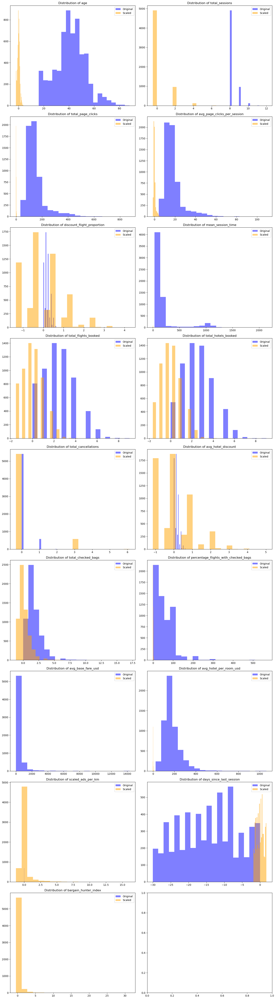

In [5]:
# Calculate basic statistics for both original and scaled data
original_stats = data.describe()
scaled_stats = pd.DataFrame(X_scaled, columns=selected_features).describe()

# Print basic statistics for comparison
print("Original Data Statistics:")
print(original_stats)
print("\nScaled Data Statistics:")
print(scaled_stats)

# Calculate the number of rows and columns for subplots
num_features = len(selected_features)
num_cols = 2
num_rows = (num_features + 1) // num_cols  # +1 to account for uneven division

# Create subplots for comparing original and scaled data columns
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 6 * num_rows))

for i, col in enumerate(selected_features):
    row = i // num_cols
    col_idx = i % num_cols
    
    axs[row, col_idx].hist(data[col], bins=20, alpha=0.5, color='blue', label='Original')
    axs[row, col_idx].hist(X_scaled[:, selected_features.index(col)], bins=20, alpha=0.5, color='orange', label='Scaled')
    axs[row, col_idx].set_title(f'Distribution of {col}')
    axs[row, col_idx].legend()

# Adjust layout
plt.tight_layout()
plt.show()

In [6]:
clustering_algorithms = [
    ('KMeans', KMeans(n_clusters=4, random_state=0)),
    ('Agglomerative', AgglomerativeClustering(n_clusters=4)),
    ('DBSCAN', DBSCAN(eps=0.5, min_samples=5)),
    ('GMM', GaussianMixture(n_components=4, random_state=0))
]

# Assign X_scaled back to X
X = X_scaled

for data_label, data_matrix in [('Original', X), ('Scaled', X_scaled)]:
    print(f'Clustering Results for {data_label} Data:')
    
    for name, algorithm in clustering_algorithms:
        clusters = algorithm.fit_predict(data_matrix)
        
        unique_labels, label_counts = np.unique(clusters, return_counts=True)
        valid_labels = unique_labels[label_counts > 1]
        
        if len(valid_labels) > 1:
            silhouette_avg = silhouette_score(data_matrix, clusters)
            print(f'{name} Silhouette Score: {silhouette_avg}')
        else:
            print(f'{name} has only singleton clusters, skipping silhouette score')
    
    print()  # Print an empty line to separate between original and scaled data


Clustering Results for Original Data:


C:\Users\ashka\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans Silhouette Score: 0.14833621135165156
Agglomerative Silhouette Score: 0.11259363107195718
DBSCAN Silhouette Score: -0.13575549945746065
GMM Silhouette Score: 0.0747503302076581

Clustering Results for Scaled Data:


C:\Users\ashka\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans Silhouette Score: 0.14833621135165156
Agglomerative Silhouette Score: 0.11259363107195718
DBSCAN Silhouette Score: -0.13575549945746065
GMM Silhouette Score: 0.0747503302076581



KMeans is the best algorithm here.

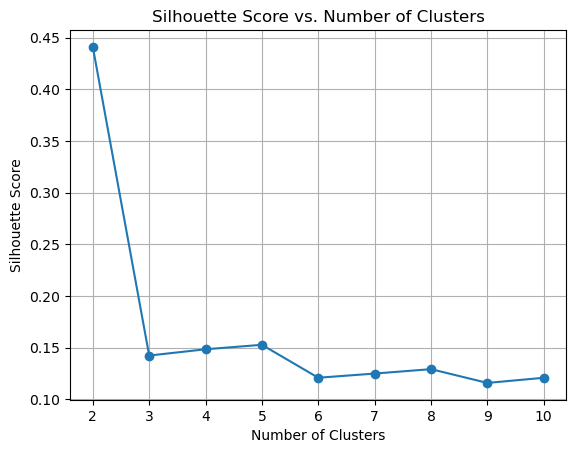

Number of Clusters: 2
Silhouette Score: 0.44100906620727603

Number of Clusters: 3
Silhouette Score: 0.1422492263323674

Number of Clusters: 4
Silhouette Score: 0.14833621135165156

Number of Clusters: 5
Silhouette Score: 0.1526559122619327

Number of Clusters: 6
Silhouette Score: 0.12076301319029042

Number of Clusters: 7
Silhouette Score: 0.12481592572617012

Number of Clusters: 8
Silhouette Score: 0.12908205183252644

Number of Clusters: 9
Silhouette Score: 0.11575240717228531

Number of Clusters: 10
Silhouette Score: 0.1207289654436155



In [7]:
# Select the range of cluster numbers to try
num_clusters_range = range(2, 11)

# Initialize lists to store silhouette scores and KMeans models
silhouette_scores = []
kmeans_models = []

# Loop through the range of cluster numbers and fit KMeans models
for num_clusters in num_clusters_range:
    kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=0)
    clusters = kmeans.fit_predict(X_scaled)  # Use X_scaled here instead of data_copy
    kmeans_models.append(kmeans)
    
    # Calculate the silhouette score for the current model
    silhouette_avg = silhouette_score(X_scaled, clusters)  # Use X_scaled here
    silhouette_scores.append(silhouette_avg)

# Plot the silhouette scores to help determine the optimal number of clusters
plt.plot(num_clusters_range, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs. Number of Clusters')
plt.grid()
plt.show()

# Print silhouette scores for each cluster number
for i, num_clusters in enumerate(num_clusters_range):
    print(f"Number of Clusters: {num_clusters}")
    print(f"Silhouette Score: {silhouette_scores[i]}\n")


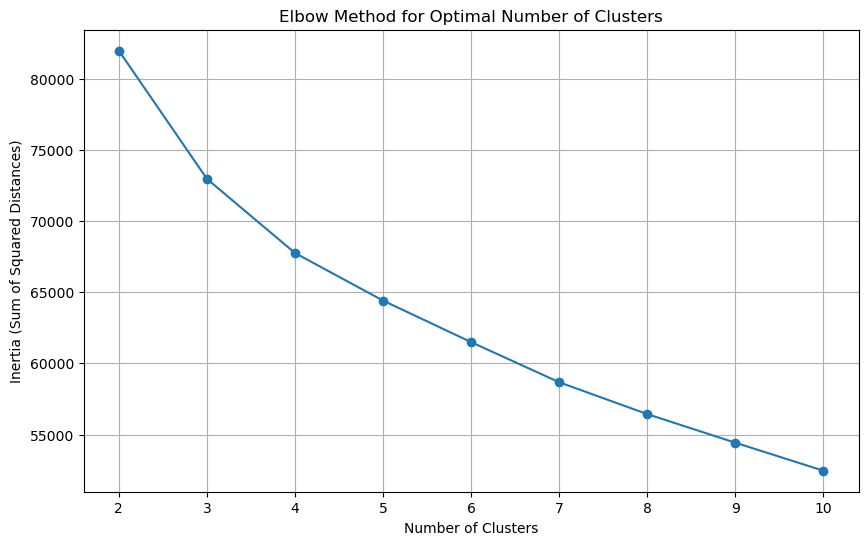

Number of Clusters: 2
Inertia Score: 81971.28254650137

Number of Clusters: 3
Inertia Score: 72963.57771517568

Number of Clusters: 4
Inertia Score: 67752.83039922416

Number of Clusters: 5
Inertia Score: 64409.16034282207

Number of Clusters: 6
Inertia Score: 61491.589257456195

Number of Clusters: 7
Inertia Score: 58671.33590499168

Number of Clusters: 8
Inertia Score: 56432.437300447855

Number of Clusters: 9
Inertia Score: 54423.058966380355

Number of Clusters: 10
Inertia Score: 52454.631595419625



In [8]:
# Initialize list to store the sum of squared distances (inertia) and KMeans models
inertia_scores = []
kmeans_models = []

# Loop through the range of cluster numbers and fit KMeans models
for num_clusters in num_clusters_range:
    kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=0)
    kmeans.fit(X_scaled)
    inertia_scores.append(kmeans.inertia_)
    kmeans_models.append(kmeans)

# Plot the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(num_clusters_range, inertia_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Sum of Squared Distances)')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.grid()
plt.show()

# Print inertia scores for each cluster number
for i, num_clusters in enumerate(num_clusters_range):
    print(f"Number of Clusters: {num_clusters}")
    print(f"Inertia Score: {inertia_scores[i]}\n")

In [11]:
kmeans = KMeans(n_clusters=4, n_init=10, random_state=0)

# Fit KMeans to the data and obtain cluster labels
cluster_labels = kmeans.fit_predict(X_scaled)

# Add cluster labels to your original data
data_copy['cluster'] = cluster_labels

# Print statistics for each cluster
cluster_statistics = data_copy.groupby('cluster').describe()

# Print the statistics for each cluster
print(cluster_statistics)

        user_id                                                             \
          count           mean           std       min       25%       50%   
cluster                                                                      
0        2571.0  541886.935434  59474.465556  101961.0  516615.0  537123.0   
1         157.0  544696.592357  65641.529456  216796.0  513347.0  538108.0   
2         527.0  541886.349146  79042.251638  106907.0  514776.0  542142.0   
3        2743.0  549497.087131  66553.304601   23557.0  518695.0  543817.0   

                                age                                          \
              75%       max   count       mean        std   min   25%   50%   
cluster                                                                       
0        568936.0  801660.0  2571.0  43.099572   8.100500  16.0  38.0  43.0   
1        577534.0  742639.0   157.0  39.872611  12.024935  17.0  31.0  40.0   
2        581102.5  796032.0   527.0  40.531309  12.329077 

Cluster 0: Refined Globetrotters

Cluster 0, consisting of 2,571 individuals, is characterized by seasoned travelers who value quality and comfort. With an average age of 43.10, this group demonstrates a preference for refined experiences. They engage in an average of 8.22 sessions, exploring the platform's offerings with thoroughness. Their discerning behavior is further highlighted by their interaction, resulting in an average of 146.17 total page clicks. These travelers accept flight discounts at a rate of 15.77%, reflecting their selective nature. Their average base fare for flights is $460.67, indicating their inclination towards higher-class travel. They book an average of 3.45 flights and 3.47 hotels, showing a comprehensive approach to trip planning. Considering their preferences, offering them an exclusive discount on flights or a complimentary hotel meal could enhance their travel experiences.

Cluster 1: Thoughtful Adventurers

Cluster 1, comprising 157 individuals, exhibits a more contemplative and exploratory approach to travel. With an average age of 39.87, this group seeks well-considered experiences. Engaging in 8.21 sessions on average, they interact deeply with the platform's content, resulting in an average of 131.93 total page clicks. They accept flight discounts at a rate of 35.43%, suggesting they are open to value-oriented options. Their average base fare for flights is $767.45, indicating a diverse range of travel preferences. This cluster typically books an average of 2.06 flights and 2.15 hotels. Given their preference for value, offering them a free checked bag could be an enticing perk that complements their thoughtful approach.

Cluster 2: Energetic Enthusiasts

With 527 members, Cluster 2 embodies dynamic travelers with a zest for adventure. Their average age of 40.53 reflects their spirited nature across age groups. Engaging in an average of 8.26 sessions, they showcase an impressive average of 322.51 total page clicks, suggesting a comprehensive exploration of options. This cluster accepts flight discounts at a rate of 28.41% and has a higher average base fare for flights at $1,102.06, indicative of their eagerness for new experiences. Booking an average of 3.69 flights and 3.58 hotels, they exhibit a prolific booking pattern. To complement their enthusiastic approach, offering them an exclusive discount on flights or a free hotel night could enhance their vibrant journeys.

Cluster 3: Dynamic Explorers

Cluster 3, encompassing 2,743 individuals, represents dynamic explorers with diverse preferences. With an average age of 39.11, this cluster engages in 8.18 sessions, showcasing an average of 109.04 total page clicks. Their acceptance rate for flight discounts is 17.22%, and their average base fare for flights stands at $443.35. This group books an average of 1.16 flights and 1.38 hotels, displaying a focused approach to travel arrangements. Considering their varied preferences, offering them the perk of no cancellation fee could cater to their flexible travel plans and foster loyalty.

In summary, tailoring perks based on cluster characteristics can enhance the travel experience and encourage loyalty among these distinct traveler groups. For Cluster 0, an exclusive flight discount or a complimentary hotel meal could align with their discerning tastes. Cluster 1 could benefit from a free checked bag, complementing their value-conscious approach. Cluster 2's energetic spirit could be matched with an exclusive flight discount or a free hotel night. Finally, Cluster 3's diverse preferences could be met with the perk of no cancellation fee, accommodating their varying travel plans.

In [12]:
# Create a dictionary to map cluster numbers to their corresponding names
cluster_names = {
    0: "Refined Globetrotters",
    1: "Thoughtful Adventurers",
    2: "Energetic Enthusiasts",
    3: "Dynamic Explorers"
}

data_copy['segment'] = data_copy['cluster'].map(cluster_names)

<Figure size 1500x1500 with 0 Axes>

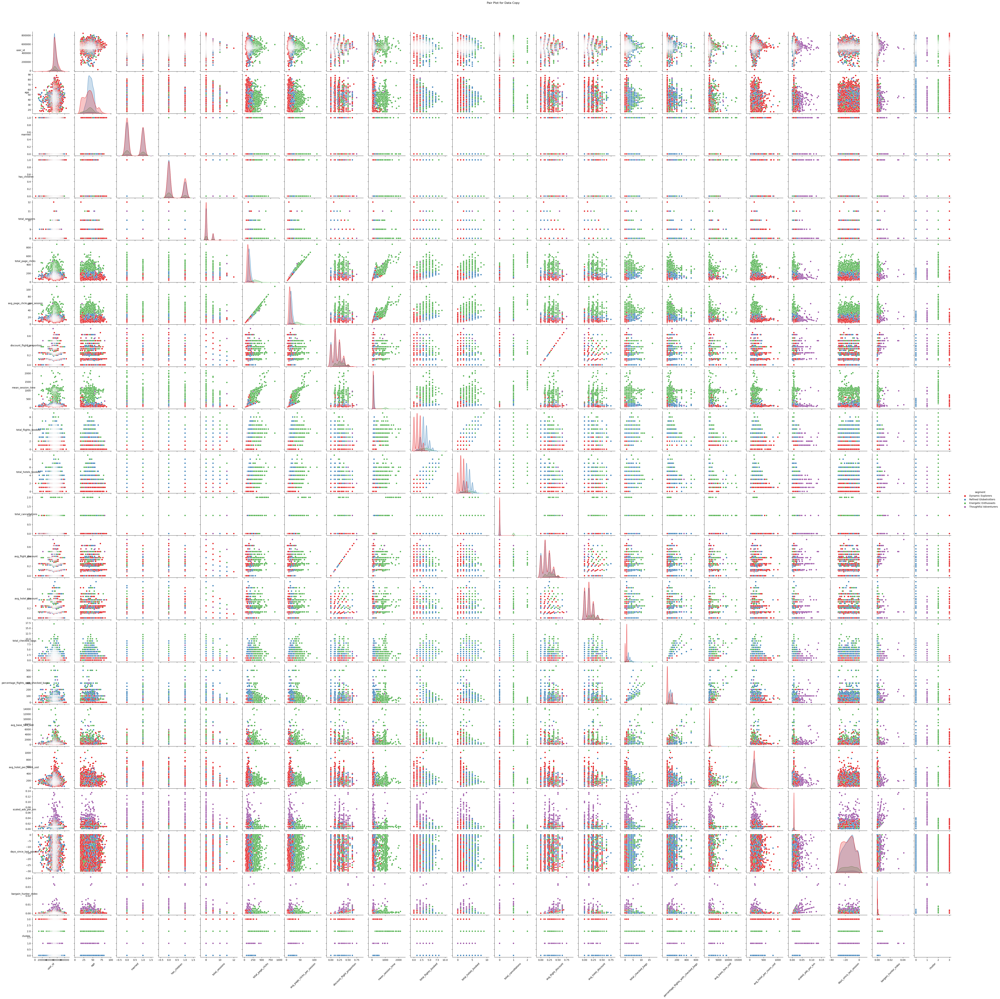

In [13]:
# Pair plot for 'data_copy'
plt.figure(figsize=(15, 15))
pairplot_data_copy = sns.pairplot(data_copy, diag_kind='kde', hue='segment', palette='Set1')
pairplot_data_copy.fig.suptitle('Pair Plot for Data Copy', y=1.02)
for ax in pairplot_data_copy.axes.flat:
    ax.set_xlabel(ax.get_xlabel(), rotation=45)
    ax.set_ylabel(ax.get_ylabel(), rotation=0)
plt.show()

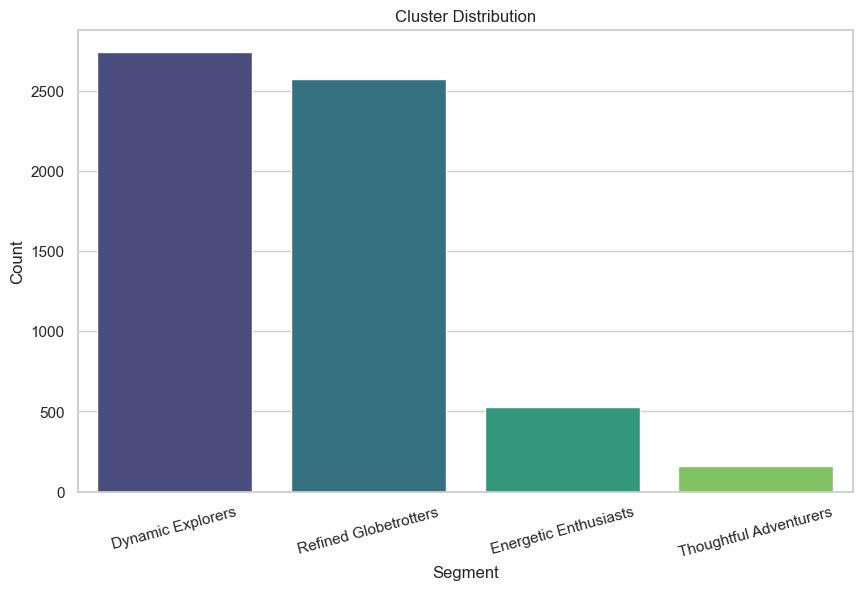

In [14]:
# Set the style for seaborn plots
sns.set(style="whitegrid")

# Visualize Cluster Distribution
plt.figure(figsize=(10, 6))
sns.countplot(x='segment', data=data_copy, palette='viridis')
plt.title('Cluster Distribution')
plt.xlabel('Segment')
plt.ylabel('Count')
plt.xticks(rotation=15)
plt.show()

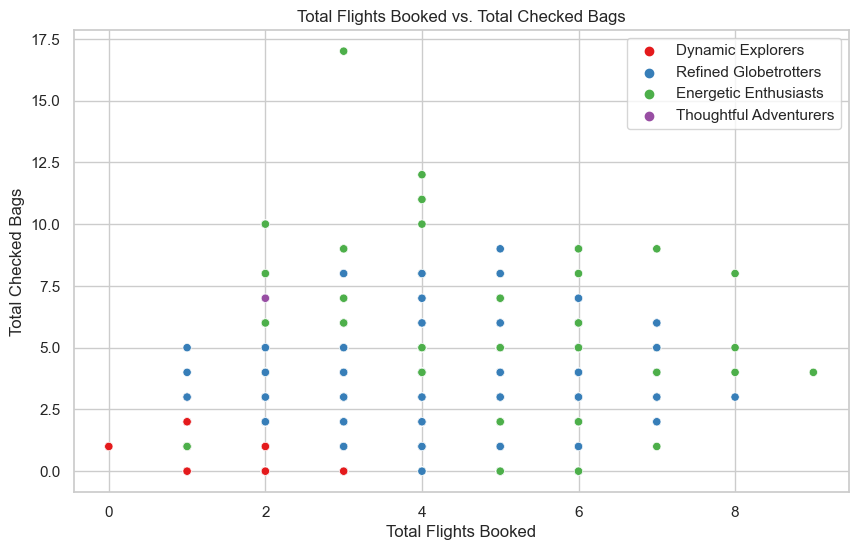

In [15]:
# Visualize Total Flights Booked vs. Total Checked Bags
plt.figure(figsize=(10, 6))
sns.scatterplot(x='total_flights_booked', y='total_checked_bags', hue='segment', data=data_copy, palette='Set1')
plt.title('Total Flights Booked vs. Total Checked Bags')
plt.xlabel('Total Flights Booked')
plt.ylabel('Total Checked Bags')
plt.legend()
plt.show()

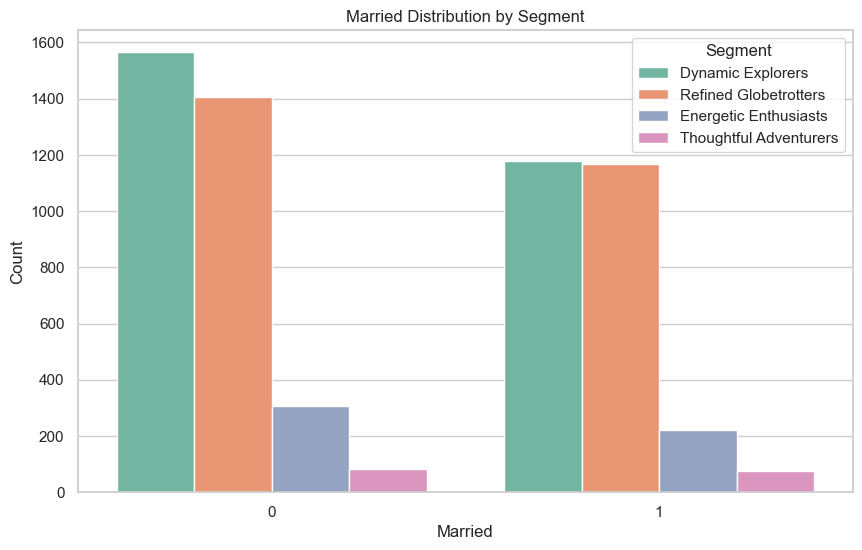

In [16]:
# Visualize Married Distribution
plt.figure(figsize=(10, 6))
sns.countplot(x='married', hue='segment', data=data_copy, palette='Set2')
plt.title('Married Distribution by Segment')
plt.xlabel('Married')
plt.ylabel('Count')
plt.legend(title='Segment')
plt.show()

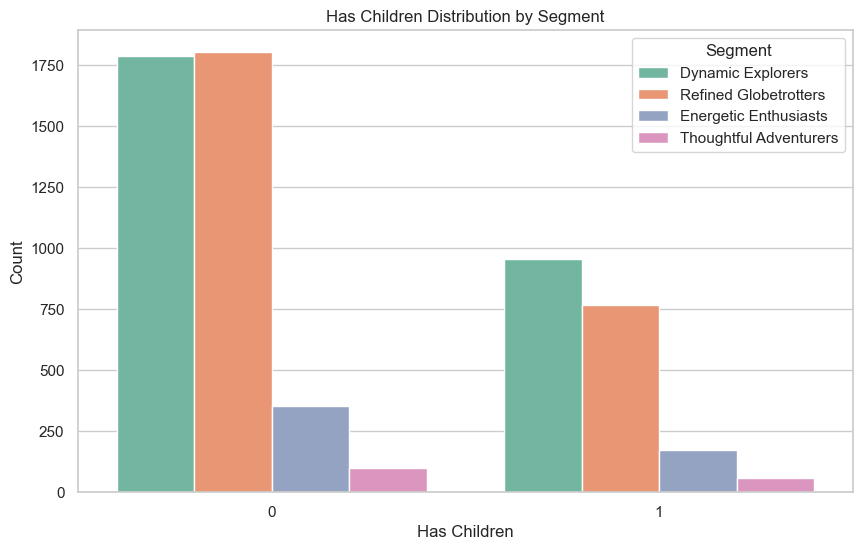

In [17]:
# Visualize Has Children Distribution
plt.figure(figsize=(10, 6))
sns.countplot(x='has_children', hue='segment', data=data_copy, palette='Set2')
plt.title('Has Children Distribution by Segment')
plt.xlabel('Has Children')
plt.ylabel('Count')
plt.legend(title='Segment')
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


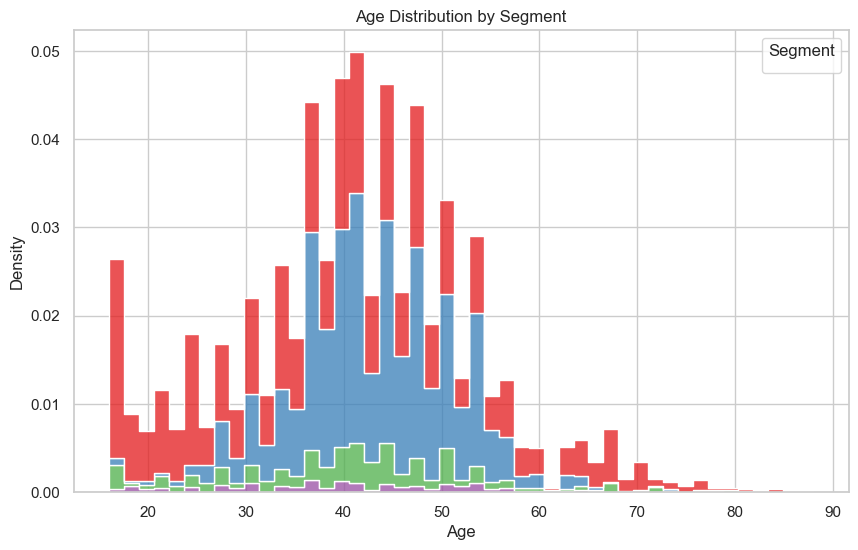

In [18]:
# Visualize Age Distribution
plt.figure(figsize=(10, 6))
sns.histplot(data=data_copy, x='age', hue='segment', multiple='stack', palette='Set1', element='step', stat='density')
plt.title('Age Distribution by Segment')
plt.xlabel('Age')
plt.ylabel('Density')
plt.legend(title='Segment')
plt.show()

In [25]:
# Add cluster labels and segment names to data_copy
data_copy['cluster'] = cluster_labels
data_copy['segment'] = data_copy['cluster'].map(cluster_names)

# Export the data_copy DataFrame to an Excel file
excel_file_path = r"C:\Users\ashka\OneDrive\Documents\DA 205 Segmentation\New folder\data_copy_with_clusters.xlsx"
data_copy.to_excel(excel_file_path, index=False)
print(f"Data with clusters and segments exported to '{excel_file_path}'")

Data with clusters and segments exported to 'C:\Users\ashka\OneDrive\Documents\DA 205 Segmentation\New folder\data_copy_with_clusters.xlsx'
